# InceptionNet 관련 문헌

In [4]:
# 2014년도 대회에서 우승!!!
# 2014년도에서 다른 등수에 VGG
# ===> 사람들이 GoogleNet많이 사용하지 않을까???
# 사람이 그닥...사용을 안 했음...
# VGG 직관적이고, 구현이 용이함!!!
# 용어 : 초창기 googleNet ---> IncetptionNet ++ Ver Up

In [5]:
# 기존의 일반적인 CNN 설계 방식
# --> Conv - Pool
#     + Conv 갯수를 늘려가면서 Channel 은 크게 가져가는 방식!!!!

* 초기 버전) https://arxiv.org/pdf/1409.4842.pdf
* Inception V4) https://arxiv.org/pdf/1602.07261.pdf

- GoogleNet이라는 이름으로 초기에는 나왔음
- GoogleNet은 ILSVRC 2014 대회에서 우승을 차지한 모델
--  상위 5개 클래스 기준 오류 6.7% 달성
--  그 이훙 version 4까지 발전을 하였으며
-- `초기 googlenet을 Inception V1`이라고도 함!!

- 전형적인 Conv구조를 탈피하여 네트워크 모듈을 쌓는 방식의 `네트워크 속 네트워크`의 구조 방식으로 설계를 함
- 전체 파라미터의 수가 ILSVRC 2012에서 압도적으로 우승을 한 AlexNet대비 파라미터의 수는 10배 이상 적고, 깊은 신경망을 구성할 수 있는 효율적인 구조
- `구글넷의 네트워크 모듈을 Inception`이라고 하며, 아래 그림에서 보이는 부분을 Inception Module임! (논문 참조)



<img src="https://drive.google.com/uc?id=1i6JQXgdH2JI_grwyi6U_hX2dGt3G6_eN">

# 기본 설계 원리

* Sparsity & Density
    + Sparsity : 극히 일부 구성 요소 사이에서만 상호작용이 일어남
    + Density : 대부분의 구성 요소 사이에 상호 작용이 일어남
        + 인공신경망 관점 : 완전 연결Full Connection보다도 상관성이 있는 출력끼리 연결된  `희소 연결 구조를 갖는 편이 훨씬 효율적`일 것임
        +HW 관점 : 연산 효율의 측면에 있어서는 `조밀성을 가지는 구조가 훨씬 효율적`일 것임.
* Inception Module : 인공신경망의 성능과 컴퓨팅 자원의 효율성을 높이기 위한 `희소 연결 구조`를 가지면서, 동시에 HW적인 연산 효율을 위해서 `조밀 연산`구조를 하도록 설계가 되어 있음!



<img src="https://drive.google.com/uc?id=1i6JQXgdH2JI_grwyi6U_hX2dGt3G6_eN">

* 4가지 역할
    + 1 X 1 Conv : 채널 특징 인식
    + 3 X 3 Conv : 서로 다른 크기 특징 추출
    + 5 X 5 Conv : 서로 다른 크기 특징 추출
    + 3 X 3 MaxPool : 가장 두드러지는 특징 인식
* 대략적 컨샙 : 여러 사이즈를 가진 Conv를 통과 시켜서 나온 FeatureMap을 Concat해서 쌓아서 하자!! ==> 이 부분에서 `쌓기 위해서는 모양을 잘 맞춰`야 함!!! ( 논문에서 stride는 1로 고정하고, padding을 컨트롤 하면서 하였다고 함)

* 아래 기본적인 inception module에 대해서 가지는 문제점
    - 아래 그림과 같이 28X28X192가 들어가서 나오는 결과는 28X28X(192+128+96+256) 으로 672개의 chanel이 생성이 됨;;;;
    - 채널이 약 256에서 672개로 2.5배 정도 늘어남
    - 결론: 가장 문제점은 바로 보이는 채널의 수가 과도하게 증가하는 현상이 나타남! ==> 이는 연산량의 증가를 야기하게 됨!!!

<img src="https://drive.google.com/uc?id=1PaKN4xBknGJ9tp6gfw4xMBosj4LtS61O">

In [6]:
# --> 아래 그림과 같은 대안을 제시를 함 : 중간 병목측 추가

* 위의 개선된 방법의 핵심은 중간에 `Bottleneck layer`를 추가를 하는 것임!!!
    - 채널의 수 감소
    - 그로 인한 연산량 감소

<img src="https://drive.google.com/uc?id=1ur1w2Y2Gy8wMYa_wAevb9mOAT6V6RIw3">

# 모델의 구조

<img src="https://drive.google.com/uc?id=10ppxqEc6PWlVqdEggbZmdfTWnuAGiKPg">

<img src="https://drive.google.com/uc?id=1PxeMPx7h6wYhj4-KdXYMZh6IMZwlZuyB">

<img src="https://drive.google.com/uc?id=1o0VD0pCJ2VT7p0gceMb2ftoHAI0IgUYl">

* 위의 그림을 보면 알 수 있듯이
    - stem : 신경망의 도입부로 Copnv/Pool로 구성이 됨 --> 초기에는 인셉션의 효과가 없어서 일반적인 Conv로 구성
    - Body : inception module 9개 쌓음( 중간 그림의 3(a) ~ 5(b)까지, 1/3/8번째에는 inception 전에 maxPool사용해서 FeatureMap의 크기를 줄임
    - Final Clf : 완전 연결 FC을 사용하는 것 대신에 AvgPool을 사용해서 파라미터의 수 줄임
    - 보조 분류기 auxliary Clf : 2개의 보조 분류기를 사용 --> 하위 계층에 경사도를 원할히 공급 & 정규화 역할을 함.( 훈련에서만 사용하고, Test에서는 사용하지 않음!!)

* 보조 분류기 : 깊어지면서 발생을 하는 Gradient Vanishing 문제를 해결하기 위해서 중간에서도 BackPropagation을 시도하기 위해서 한 계층임.
* 참고 : InceptionNet V2이후 부터는 별로 큰 효용이 없어서 1개 줄이다가 V4에서는 사용하지 않음!

In [7]:
# 아래는 그 당시 ver1의 성능표(논문)

<img src="https://drive.google.com/uc?id=1F5v9ctAanT21YcsMwuKbKdwchYsr6RHH">

* 위의 표들은 그 전까지의 대회에서 수상한 모델들의 성능을 중심으로 표현하고 있는 것
* 7개의 모델( 앞의 모델과 동일한 사이즈 6개 + 1개 큰 모델)을 앙상블을 함
* 여러가지 resize를 하고, crop을 해서 진행을 하였다고 함 ==> 제일 best는 1장의 사진을 144개의 이미지로 crop/resize를 통해서 7개의 모델을 통해서 앙상블한 것이 제일 Best!!!!
*

# 결론
- 여러 사이지의 필터를 통과한 FeatureMap을 합쳐서 Channel로 사용함
- 1X1 Conv로 파라미터의 갯수를 좀 줄여서 처리함
- V1은 auxiliary clf가 있어서 Gradient Vanishing을 상쇄하려고 하였지만, 이후 모델에서는 이 부분을 줄여나감

# Inception Version 2/3

In [8]:
# 줄인다고 줄인거 같지만,,,구조가 복잡해..
# ==> VGG보다 복잡하네...성능도 1/2 별로 차이 없는데,,
#     편하게 하지 뭐...
# ==> ver1 핵심 : conv 1*1 --> Channel을 컨트롤 하자!!!
#                + FM의 Channel에 대해서 다양한 특성을 반영시키자!!
#                       (1*1, 3*3, 5*5, MP)
#                             --- 3*3, 5*5 앞에서 1*1 미리 줄이고...

* ref) https://arxiv.org/pdf/1512.00567.pdf
* 사람들이 여전히 자신들이 1등을 하여도 VGG를 많이 사용하기에, 자신들이 모델의 파라미터도적고 한데 왜 VGG만 사용하나에 대한 복기로 시작
* 개선방법1
    - 5X5 Conv 1번 연산이 3X3 Conv 를 2번 사용한 것 대비 연산이 약 2.78배 더 많이 사용함( 25 / 9 = 2. 78 )

<img src="https://drive.google.com/uc?id=1R91kPopUInjEAQZ23dcPpp-TSDxXnxSO">

<img src="https://drive.google.com/uc?id=1vmEOmLdKqaHCrAbN6PwpS21IsJ051xtd">

* 개선방법2
    - 비대칭을 활용
    - N X N Conv에 대한 것을 연산을 줄이기 위해서 1 X N Conv + N X 1 Conv로 처리함
    -

<img src="https://drive.google.com/uc?id=1lwpZXa1aYiRJiGmGGawXciacSkScqZwY">

<img src="https://drive.google.com/uc?id=1YDpheAwHcDkRPvVabXJ-suDWDTOFFD0l">

* 개선방법3
    - `Conv + Pool 이나 Pool + Conv 나 결론적인 부분은 동일`한데,,이 것을 `어떤 순서로 할까의 문제`가 발생함 ==> 아래 그림에서 왼쪽은 Pool먼저, 오른쪽은 Conv먼저
    - 효율적인 크기 줄이기 : 아래 그림에서 너무나 Pooling을 해서 35X35X320을 17X17X320으로 하게되면,  Representational Bottleneck( 입력 정보 확 줄어버리는 것 )이 발생하게 됨!!
    - 오른쪽으로 같이 변경을 하게 되면, 정보가 줄어드는  Representational Bottleneck은 피할 수 있지만 연산량이 엄청 증가를;;;
    - 결론 : 아래 그림과 같이 stride=2로 한 결과를  concat하자로 ==> inception과 pooling을 동시에 수행!

<img src="https://drive.google.com/uc?id=14Shr8mQhgO5lIvw65b4cW4SUU1yLUp-k">

* 개선방법4
    - Auxiliary CLF 에 대해서는 Version1 대비해서 1개만 사용을 하도록 수정
    - 1개에는 BatchNormal을 적용

<img src="https://drive.google.com/uc?id=16eOG1XUeQoheoeSaY_iSKqX7gnWf0kuA" >

* 참고) 위의 사항들을 반영해서 사람들이 직접 구현을 한 것들은 이런 기본 구조에서 조금씩 다르고, 맨 아래 표시한 것을 V3이라고 함

<img src="https://drive.google.com/uc?id=1bmEAYWEePyBcQWsEoqK7NL7Q67BJvkYp">

In [9]:
# Version의 핵심 : 3*3 ==> (3*1) * ( 1* 3) 쪼개서 연산량을
#                   대략 30% 정도 줄이자!!!
# 아이디어는 : 인수분해!!!!!!!
# 일반적으로 주로 이야기하는 버전은 Inception V3를 중심으로...

# 예제 적용

In [10]:
# 견종 데이터 셋
#https://www.kaggle.com/c/dog-breed-identification
# Kaggle + 수업 때 까지 최적화해서 올려보세요!!!!!

In [11]:
# 구글드라이브에 있는  파일에 대한 id를 가지고
# colab에 다운로드 함..
# 이것을 실행하면
# colab의 content에 train.zip, test.zip
!gdown https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y
!gdown https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH

Downloading...
From (original): https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y
From (redirected): https://drive.google.com/uc?id=1szLijK-O-QT5LA9ytCPassTtxMg-uJ_y&confirm=t&uuid=156d0340-7563-4933-a887-3c4a7143b498
To: /content/train.zip
100% 361M/361M [00:09<00:00, 37.1MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH
From (redirected): https://drive.google.com/uc?id=1z3n7y7RQKlseNBpb4XoRLKjTQGd8pExH&confirm=t&uuid=8b9f8f6d-9c7f-4075-86f9-a0a3cc250660
To: /content/test.zip
100% 363M/363M [00:10<00:00, 36.2MB/s]


In [12]:
# 샘플 submission, labels.csv 파일 다운로드
!gdown 1Iq0uGTax-qpAQbjdYrFPEJivoFLFc0bR
!gdown 1kKSzJISTf06tVccOwAC-1HEsdHzFKuwS

Downloading...
From: https://drive.google.com/uc?id=1Iq0uGTax-qpAQbjdYrFPEJivoFLFc0bR
To: /content/sample_submission.csv
100% 25.2M/25.2M [00:00<00:00, 75.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1kKSzJISTf06tVccOwAC-1HEsdHzFKuwS
To: /content/labels.csv
100% 482k/482k [00:00<00:00, 95.6MB/s]


In [13]:
# colab에서 zip파일 푸는 여러 방식 중에 간단히 unzip
# zip 파일을 푸는 과정 : unzip -qq 풀려는대상 -d 압축풀경로
!unzip -qq "/content/train.zip" -d "/content/train/"

In [14]:
!unzip -qq "/content/test.zip" -d "/content/test/"

In [15]:
# 제대로 풀렸는지 확인!!!!!
import os
import glob
# --> 운영 체제 내에서 관련 파일 접근, 정보 etc

In [16]:
len(list(glob.glob("/content/train/*.jpg")))

10222

In [17]:
len(list(glob.glob("/content/test/*.jpg")))

10357

In [18]:
# ---> 뒤에 모델을 활용해서 적용을 할 때는..
#      폴더 구조로 학습을 시킴!!!!
# train폴더 안에 sub폴더명이 정답지의 이름으로 구성...
#                sub폴더안에 원하는 데이터의 이미지들이 있어야 함!!!

# 예)
# train/~~~.jpg, ~~~.jpg ,,,,,,,,,,, [지금 구성]
# train/진돗개/1111.jpg, 2222.jpg , 3333.jpg etc
# train/요크서/99.jpg, 11003.jpg
# --> 정식적인 데이터셋들은 주로 이런 식으로 구성해서 배포
#     kaggle은 대회에 따라서 양식은 그 때 그 때 달라요....

In [19]:
# 폴더 세팅 : train/test org
# ---------> 새로운 경로에 하위 폴더를 종별로 선별해서 생성..
# 저는 코드상 편의를 위해서..그냥 복사를 선택하겠습니다.(이동)

train_data_folder = "/content/train/"
test_data_folder  = "/content/test/"

# train --> 종류별로..
train_data_sub_folder = '/content/train_sub/'
# valid나, test에 대한 정답을 안다면,,,
#test_data_sub_folder = '/content/test_sub/'

In [20]:
# 정답에 대한 파일 label.csv 파일을 불러와서
# 여기에 있는 기준대로 폴더도 생성하고, 파일도 복사!!!
# ===> 파일 정리의 기준!!!!!!
# 참고) csv 파일이니..pandas
import pandas as pd

In [21]:
label_path = '/content/labels.csv'
label_text = pd.read_csv(label_path)
label_text.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [22]:
# 체크1) 학습할 데이터의 견종의 수
len(label_text.loc[:,"breed"].unique())
# --> 문서에 있는 120견종에 대한 부분이 일치!!!!

120

In [23]:
# 체크2) 각 종류별로 균형이 맞는지,,,안 맞는지....
# ==> 견종별로 몇 장이 데이터가 있는지 체크....
label_text.loc[:,"breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

In [24]:
# ===> 견종별로 완벽하게, 엇비슷하게 데이터가 있지는 않음!!!!!
#      통일되게 66장으로 하겠다...
#               데이터증강을 통해서 120장으로 하겠다....
#      .... 선택들을 하셔야 함!!!!!!!!
#      +++ 시간적인 요소!!!!!
#      +++ 코드적으로 데이터 증강을 하면 오히려 방해가 될 수 있음.
#          ( 적당하게 셋을 생성을 해야 함 !!!!)

In [25]:
# 체크3) 이미지 파일의 수 == 정답지의 수 체크.....
len(list(glob.glob("/content/train/*.jpg")))

10222

In [26]:
glob.glob("/content/train/*.jpg")[:3]

['/content/train/07b5288a0bb8b9cf1a42d281a9451e51.jpg',
 '/content/train/03da788cc7e5c111575daf04e7e3910c.jpg',
 '/content/train/c85fdb661bce3147ba6560f1f72cbbdd.jpg']

In [27]:
len(label_text)

10222

In [28]:
# ==> 10222장의 이미지들을 정답지를 반영해서
#      하위 폴더 구조로 변경을 하면 됨!!!!!
# 대상 : glob.glob("/content/train/*.jpg") 이미지 리스트들만..

In [29]:
# 데이터 탐색...
# 이미지 데이터에 대한 탐색.....시각화
import matplotlib.pyplot as plt
# 1) matplot
# 2) opencv
# 3) tensorflow~~~image
# 본인이 했던 코드 재활용, 검색해서 나오는거 복붙...

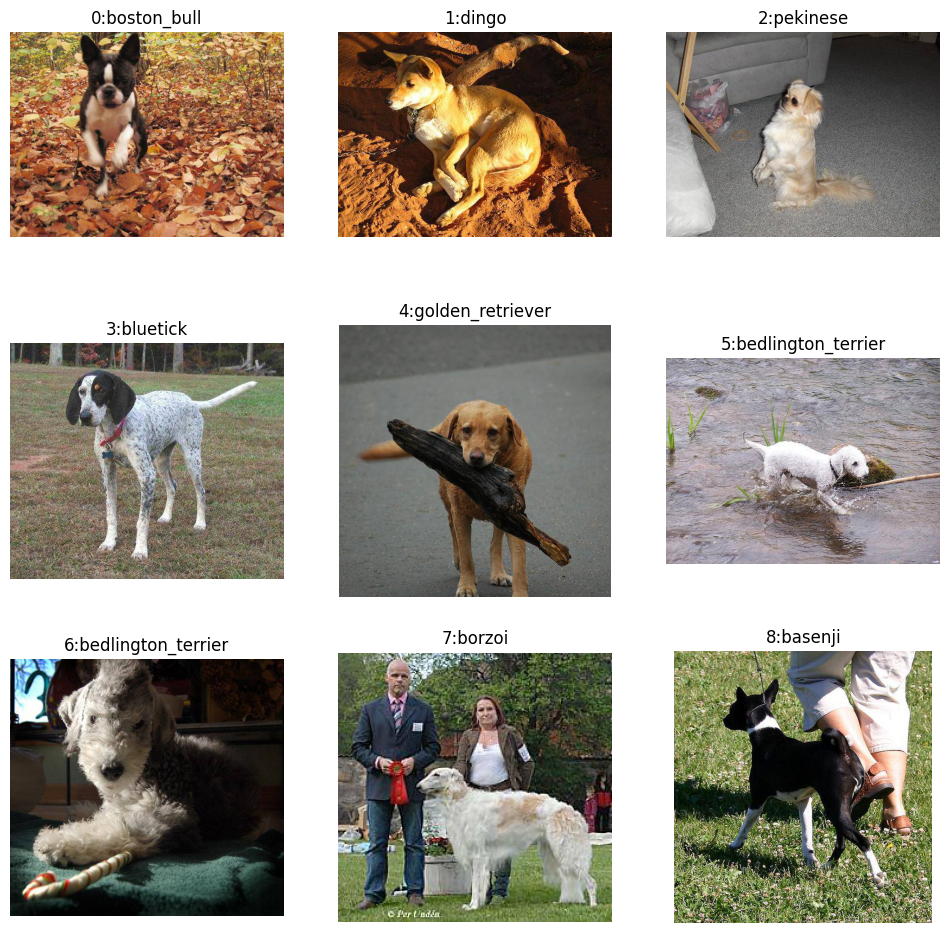

In [30]:
plt.figure( figsize=(12,12))
# --> 임의로 train 폴더에 있는 9개를 가지고 와서
#     탐색을 해보겠습니다...
for c in range(9): # 숫자를 쓴 이유는 sub-plot에 그릴려고...위치
    # 정답 df에서 해당 id를 가지고 오겠음...
    # ---> id.jpg를 붙여서 이미지를 땡겨오려고 함...
    image_id = label_text.at[c,"id"]
    image_breed = label_text.at[c,"breed"]

    # 9개 그리기 위한 그림에 대한 위치...
    plt.subplot(3,3,c+1)

    # train 폴더에서 해당하는 image_id 이미지 파일을 가져와야 함...
    image_file = train_data_folder + image_id + ".jpg"
    plt.imshow(plt.imread(image_file))
    plt.title(str(c) + ":" + image_breed)
    plt.axis("off")
plt.show()

In [31]:
# EDA를 통해서....
# 1) 일단 종에 대한 부분에서 색상 : 흑백은 좀..... 최대한 컬럼
# 2) 배경이 상당히 다양함 ==> 견종에 대한 특징과
#                             배경에 대한 특징이 혼재!!!
#    +++ Segmenation(다른 모델을 도움을 받아서..SAM)
# 결론) 최대한 컬러를 유지하면서 하는게 어떨까!!!
#       빠르게 뭔가 해보고 싶으면,,,Gray스케일로 줄여서,,,
#       선택을 하면서!!!!

In [32]:
###############
# 내가 직접 만들어서 할 수도 있지만,,,,,
# 기존에 이미 잘 학습된 모델을 그대로 가지고 와서
# 수정해서 사용하자!!!!!
# ===> 사전 연구들을 조사를 하는 것!!!!
################

In [33]:
# 학습을 하려고 보니 폴더 구조가 문제가 됨!!!
# ===> 종별로 하위 폴더 구성을 하려고 함!!!!
import os
import time
# colab에서 할 때 : 파일 복사 등...
import shutil

In [34]:
# 파일 정리
# 1) train_sub 폴더가 없으면 생성해주세요!!!!!
train_data_sub_folder_name = os.path.dirname(train_data_sub_folder)
# 혹시 없는 폴더면,,폴더 생성해주세요...os.mkdir
if os.path.isdir(train_data_sub_folder_name) ==False:
    os.mkdir(train_data_sub_folder_name)

# 2) train_sub폴더가 생성 되었으면,,,
#     --> 정답지에 있는 파일들을 돌려가면서
#         해당하는 종에 대한 하위 폴더가 없으면
#             --> 폴더 생성
#             --> 그 이미지 복사
#         해당한느 종에 대한 하위 폴더가 있다면,,
#             --> 그 폴더 위치만
#             --> 그 이미지 복사.

In [35]:
for i in range(len(label_text)):
    # 각 데이터에서 이미지에 대한 id, 견종
    image_id = label_text.at[i, "id"]
    image_breed = label_text.at[i, "breed"] # 하위폴더명,체크/사용

    # 견종별 하위 폴더에 대한 경로를 조립...문자열
    if os.path.exists( train_data_sub_folder+image_breed)==False:
        os.mkdir(train_data_sub_folder+image_breed)
    # ==> 정답지를 보고,,,하위 폴더가 없으면 생성....

    # 기존에 train 폴더에서 다른 폴더내에 있는 서브 폴더로 이동.
    # 복사 : 무엇을 ---> 어디로 복사.
    # /content/train/1111.jpg
    #  ---> /content/train_sub/도사견/111.jpg
    shutil.copy( train_data_folder + image_id+".jpg",
                 train_data_sub_folder+image_breed )


In [36]:
# 참고) 동일한 위의 코드인데,,,,
#       기준이 되는 폴더가 구글 드라이브에서 하면,,,
#       시간이 엄청 걸리니...최대한,,,colab 해결을하세요!!!

In [37]:
# 체크) 내가 생성한 하위 폴더의 수가 정답 종류인 120개 맞냐..
len(os.listdir(train_data_sub_folder))

120

In [38]:
# ===>
# 1단계 : 단순히 입력을 위한 폴더/ 파일 구조만 변경을 함!!!!

In [39]:
# 2단계 : 이 파일 구조를 기반으로 모델에 전달할
#         generator를 만들어야 함!!!!

In [40]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [41]:
# 참고 링크 : https://keras.io/api/applications/
# ---> 내가 어떤 모델을 차용해서 사용할지 정할 수 있음!!!
# ++++ yolo(여러 이미지 관련 최신 모델들을 배포... )

# ===> 입력을 변경을 할 수는 있는데,,,기존은 224,224
# +++ 기존 모델과 내 모델의 목적이 다름!!!
# 기존 : 1000가지 이미지 분류
# 나의 튜닝 : 강아지 중심 120이미지 분류!!!
# ===> 뒤에는 수정을 해야함!!!!

In [42]:
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Input

In [43]:
# 내가 차용할 모델은 InceptionV3선택!!!
# --> 다양한 이미지들에 대해서 학습한 ImageNet 셋으로 학습한 것을
#     차용하겠다...( 다양한 이미지들의 특성을 잘 뽑겠지!!!)
# 다만, ImageNet 셋이 1000종류로 분류
# ==> output 수정을 해야할 듯!!!!!

# include_top : 뒤에....출력쪽이 1000가지 분류를 하면 사용할 수 있고
#               우리 목적은 120개로 튜닝을 해야해서...
#               이 부분은 빼고 가져고 옴!!!!!

# 원래는 224,224,3학습을 했지만,
# input~~ 지정하지 않아서 X,X,3 (컬러이미지)
# ===> 뒤에서 generator쪽에서 이미지 크기도 조정해서
#      model에 전달할 예정!!!!!

In [44]:
base_model = InceptionV3(weights='imagenet', include_top=False)
base_model.summary()

87910968/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activatio

In [45]:
from tensorflow.keras.utils import plot_model

In [46]:
plot_model(base_model, show_shapes=True )

In [47]:
# 잘 학습된 모델 구조와 가중치를 가지고 옴!!!
# 활용방식은 여러개 존재함!!!

# m1) 애가 잘 했을 꺼야,,,그냥 쓰자!!!!!
for layer in base_model.layers:
    layer.trainable = False
# 특징 추출에 대한 것들은 오로지 기존 모델로 사용하고,,,
# weight는 내 데이터로 변경하지 말자!!!!
# ==> 뒤에 분류만 나의 데이터로 학습하면서 최적화하자!!!
#     학습할 weight의 수가 확 줄어듬!!!!

In [48]:
# m2) 구조는 좋으니까..내것으로 처음부터 끝까지 다
#     다시 학습하자!!!!
for layer in base_model.layers:
    layer.trainable = True
# ====> 좋기는 함...
#       데이터와 학습의 시간이 문제!!!!!!!!

In [49]:
# m3) 앞에는 일반적인 이미지들에 대한 특징을 추출할테니
#     믿고 가는 것이고,,,
#     중간에 특징을 뽑아내는 레이어들은 나의 강아지 데이터로
#     학습을 하자!!!!
#     inceotion에서 2번째 덩어리.....249...
for layer in base_model.layers[:249]:
    layer.trainable = False
for layer in base_model.layers[249:]:
    layer.trainable = True

In [50]:
# ===> 내가 취사선택할 수 있는 옵션들!!!!!!
#      기존에 잘 학습된 모델을 어떻게 활용할지에 대한
#      활용방안도 고민을 해야 함!!!!!
# 참고) 여기서는 시간 관계상 분류만 학습을 시키겠습니다..
for layer in base_model.layers:
    layer.trainable = False

In [51]:
# 나의 목적에 맞도록 모델 구조를 수정!!!!
# 1) 앞단의 부분..... DataGenetrator~~
# 2) 출력층 : 견종120개로 세팅!!!!

In [52]:
# 최종 출력에대한 종류
num_classes = len(os.listdir(train_data_sub_folder))
num_classes

120

In [53]:
# 기존의 불러온 모델의 최종단을 수정!!!
# --> 기존 모델의 아웃풋을 가지고 와야 함..
x = base_model.output
print(x)
print(x.shape)

KerasTensor(type_spec=TensorSpec(shape=(None, None, None, 2048), dtype=tf.float32, name=None), name='mixed10/concat:0', description="created by layer 'mixed10'")
(None, None, None, 2048)


In [54]:
# 모델 설계에 필요한 모듈을 가져다가...
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D ,Dropout, MaxPooling2D
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Activation , Conv2D
from keras.applications.inception_v3 import preprocess_input
from keras import optimizers

In [55]:
# 뒤에 출력에 대한 분류에 대한 네트워크는 없었음...
# ===> 좀 구성을 하려고 함!!!!! 120종 분류에 맞춰서..
x = GlobalAveragePooling2D()(x)
x = Dropout(0.2)(x)
x = Dense( 1024, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense( 1024, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense( 512, activation="relu")(x)
####---> 분류에 대한 네트워크 설계 : 함수적인 in/out
# 출력층에 대한 설계
pred = Dense(num_classes, activation="softmax")(x)

# 전체적인 모델을 조립!!!!
# in : None, None, None, 3
model = Model( inputs= base_model.input,
              outputs= pred)

In [56]:
plot_model(model, show_shapes=True)

In [57]:
# --> 기존의 모델을 사용해서(Weight+ 구조)
#     나의 목적에 맞는 모델의 구조만 재설계!!!!!

In [58]:
# 참고) Optimizer ---> 수정
# Adam에서 나온 lr = 0.001 보통은 이야기를 함....
my_adam = optimizers.Adam(learning_rate=0.001, beta_1 =0.9, beta_2=0.999)
# ===> optimizer 에서도 여러 옵션이 있음..
#      가장 크게 :lr
#      그 다음에 여러 옵션들이 영향을 미침...

In [59]:
# 모델을 어떻게 학습할지에 대한 compile
# 참고) 우리의 목적 크게 분류 --> OL에서 라벨인코딩 : sparse~~~
#                                        OHE        : ~~~~
# 참고) 정답지를 하위 폴더 구조로 입력을 하는 경우에 있어서는 loss를 어찌세팅?
#       ==> 원핫인코딩은 안 해도, loss에 일반적인 categorical~~~~~
#           ( sparse를 안 붙여도 된다!!! )
# ==> 데이터를 밀어 넣는 방식에 따라서 설정들이 조금씩 다름!!!!!!
model.compile( optimizer=my_adam,
              loss = "categorical_crossentropy",
               metrics = ["accuracy"]
              )
# --> 일단 했던 양식 그대로 하기 위해서..기존의 accuracy로 모니터링을 함..
# 참고) 대회는 log-loss로 결정을 함..
#       이 지표로 모니터링을 하던가,,,,,유사 지표로 모니터링을 하면 됨...
#       없으면,,,만들어서 해야함!!!!( 실제는 만드는 경우가 좀 있음...)

In [60]:
# ===> 데이터를 폴더에서 모델로 넘겨주는 Generator를 생성!!!!
# ++++ 전처리, 이미지 보충, etc
# 컬러의 값 : 8비트0~255, 10비트0~1023 etc --> 정규화

In [80]:
# 사전체크 : 데이터의 픽셀의 값의 크기...
# ===> 편한 여러가지를 사용하시면 됨...
import cv2

temp_path = "/content/train_sub/affenpinscher/00ca18751837cd6a22813f8e221f7819.jpg"
temp_img = cv2.imread(temp_path)
print(temp_img.shape)
print("이미지 픽셀의 최소값:", temp_img.min())
print("이미지 픽셀의 최대값:", temp_img.max())
# ==> 이미지 값에 대한 정규화는 /255.0으로 하면 되겠다...

(338, 450, 3)
이미지 픽셀의 최소값: 0
이미지 픽셀의 최대값: 255


In [62]:
# 참고2) 이미 학습된 모델을 가지고 와서 진행!!!
# ==> 이미 전처리들을 수행을 함.....
# 혹시,,,이 InceptionV3가 수행한 전처리를 그대로 사용하려면,,
# preprocess_input 을 사용을 하면 됨..
# from keras.applications.inception_v3 import preprocess_input

In [63]:
# 데이터를 생성하는 생성기를 만들려고 함 + 전처리
# ==> 다양하게 하면,,,시간이 오래걸릴 수 있음( 데이터 보충 : 주의해서)
train_datagen = ImageDataGenerator(
    # 기존 모델 InceptionV3가 하려는거 그대로 사용하면,,
    # preprocessing_function = preprocess_input

    ###############################################
    validation_split = 0.1,
    rescale = 1./255. , # 무조건 적용을 ,,모든 경우에 다...
    ###############################################

    # 데이터 보강
    rotation_range = 40,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    # zoom_range
    # 반전 etc
    fill_mode="nearest"
)
# ==> 학습용에 대한 데이터 뽑아내는 생성기의 옵션..
#      데이터 증강도 사용할 수 있고, 전처리도 사용할 수 있음..
# ==> 너무 많이 세팅을 하면,,,다양하게 학습은 하지만,,시간이 문제가 될 수 있고
#                             이상한 데이터가 들어가서 오히려 성능이 떨어질 수도 있음..
# ------------------------ 다양하게 세팅....


# 중간에 검증용,...평가하는게 목적...이미지를 보강할 필요는 없음!!!
# validation 생성기를 따로 생성을 하려고 함..
# ==> 최소한의 분리에 대한 세팅 & 전처리
#     이미지 보강은 전혀 사용X (만약에 하면,,성능이 엄청 떨어짐..)
valid_datagen = ImageDataGenerator(
    validation_split = 0.1,
    rescale = 1./255. , # 무조건 적용을 ,,모든 경우에 다...

)

In [64]:
# 밑에서 생성할 때 공통적으로 필요한 정보
# 1) 이미지 사이즈 지정 : 299 ---> 299, 299 ( 본인의 선택 )
image_size = 299
# 2) batch_size 지정  : GPU의 vRAM에 체크하면서,,,,16~1024
batch_size = 512 # v100으로 해서..
# batch_size = 16 # T4

In [65]:
# --> 구체적으로 어디서 뽑아서 사용할지에 대한 세팅!!!!!
#     생성기 + 출처(size, batch_size, class_mode etc)
#     train/valid 따로 처리....
train_generator = train_datagen.flow_from_directory(
    # 1장에 대해서 뽑아낼 때의 옵션...
    # 1) 어디서 뽑을 꺼에요...
    train_data_sub_folder,
    # 2) 이 셋에 대한 용도 지정
    subset = "training",
    # 3) 입력에 대한 모양을 여기서 지정을 함...(선택)
    target_size = (image_size, image_size),
    # 4) 기타옵션..
    seed = 42, shuffle = True,
    batch_size = batch_size,
    class_mode = "categorical"
)
# val : 따로 설정을 해서 넘겨야 함..
#       train과 다르게 여러 데이터 증강은 빼고 진행을 함...
#       이거 넣어서 그냥 복붙하면,,이상한 사진도 평가를 해야해서
#       성능 지표가 이상하게 낮게 나타남!!! 주의해서!!!!!
valid_generator = valid_datagen.flow_from_directory(
    # 어디서 가져올 것인가..
    # =-> val 따로 폴더가 있으면, 그 폴더의 경로를 지정하면 됨!!!!
    # 단, 이 폴더도 서브 폴더가 정답으로 구성이 되어 있어야 함!!!
    train_data_sub_folder,
    # 용도
    subset="validation",
    # 3) 입력에 대한 모양을 여기서 지정을 함...(선택)
    target_size = (image_size, image_size),
    # 4) 기타옵션..
    seed = 42, shuffle = False, # 단순 평가인데,,굳이 순서가???
    batch_size = batch_size,
    class_mode = "categorical"

)

Found 9254 images belonging to 120 classes.
Found 968 images belonging to 120 classes.


In [66]:
9254 + 968

10222

In [67]:
# +++ 부수적으로 학습할 때 callback
# cp_path = "training/cp-{epoch:04d}.ckpt",
# cp_callback = tf.keras.callbacks.ModelCheckpoint(
#     cp_path,
#     verbose = 1,
#     save_weights_only=True
# )
# es_callback = tf.keras.callbacks.EarlyStopping(
#     monitor="val_loss",
#     patience = 3
# )

# 참고) 모델의 저장 위치를 colab에서 google Drive로 하셔도 되기는 함..
#       속도가 조금 느릴 수 있음...( 몇 백 메가~!~몇 기가~몇 십기가 업로드)
#       그냥 구글 드라이브에 큰거 올려도 오래걸리는데,,,
#       상황에 맞춰서 하시면 되는데,,,속도를 고민을 하세요!!!!!
cp_path = "training/cp-{epoch:04d}.ckpt"
cp_dir = os.path.dirname(cp_path) # training
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    cp_path,
    verbose = 1,
    save_weights_only = True
)
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience = 10 # 참을 횟수...갱신이 안 되는 횟수..
)


In [68]:
# 참고
int(train_generator.n / batch_size)

18

In [69]:
#  +++ 학습을 진행하는 과정에서...
# epochs 동일한데,,,
# steps_per_epochs =
# 기존에는 m.fit( X_train, y_train, validation_split, epoch, batch_size~~~)
my_steps_per_epoch = int(train_generator.n / batch_size)


history = model.fit_generator(
    # 학습할 용도의 제너레이터
    train_generator,
    # 중간 평가용의 제너레이터
    validation_data = valid_generator,

    # epochs 지정....
    epochs = 3,

    # 체크...: batch_size X ==> steps_per_epoch
    steps_per_epoch =my_steps_per_epoch ,

    # callback
    callbacks=[cp_callback,es_callback],

    ####### Use multiprocessing
    # ---> 최대한 자원을 끌어다 사용을 하는 것..n_jobs =- 1
    #      장점은 가용자원 끌어다 사용하지만,,,
    #      colab에서는 중지가 잘 안되는 현상이 발생을 함....
    # ---> 완전히 처음부터 다시 해야하는 상황들이 종종 발생을 함..
    # use_mulitprocessing=True
)

<ipython-input-69-ac9a83918dfa>:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/3
18/18 [==============================] - ETA: 0s - loss: 3.5109 - accuracy: 0.2760
Epoch 1: saving model to training/cp-0001.ckpt
18/18 [==============================] - 209s 10s/step - loss: 3.5109 - accuracy: 0.2760 - val_loss: 0.9615 - val_accuracy: 0.7696
Epoch 2/3
18/18 [==============================] - ETA: 0s - loss: 1.2358 - accuracy: 0.6652
Epoch 2: saving model to training/cp-0002.ckpt
18/18 [==============================] - 173s 10s/step - loss: 1.2358 - accuracy: 0.6652 - val_loss: 0.5287 - val_accuracy: 0.8481
Epoch 3/3
18/18 [==============================] - ETA: 0s - loss: 0.9352 - accuracy: 0.7245
Epoch 3: saving model to training/cp-0003.ckpt
18/18 [==============================] - 173s 10s/step - loss: 0.9352 - accuracy: 0.7245 - val_loss: 0.4326 - val_accuracy: 0.8729


In [75]:
#### 위에 학습을 시킨 결과
#     ---> 최적의 모델을 선택을 하고,,,
#     ---> test 문제를 풀어야 함!!!!!!!!
# 방식1) test 문제를 풀 generator를 생성---> 모델에 전달하는 방식..
#        ==> 주의사항들이 존재를 함!!!!
test_datagen = ImageDataGenerator(
    rescale = 1./255.
)
test_generator = test_datagen.flow_from_directory(
    ### ===> 구조에 주의를 하셔야 함!!!!!!
    #     /content /
    #              / test /
    #                     / aaa.jpg
    #                     / bb.jpg
    # ==> test 폴더가 마치 정답을 의미하는 하위 폴더로 구조
    directory = "/content",
    classes =["test"],
    # 공통적인 이미지 크기 처리
    target_size = ( image_size, image_size),
    # 기타 설정
    class_mode = "categorical",
    shuffle =False,
    batch_size = batch_size
)

#############
### 중요!!! 순서가 랜덤하게 섞이는 경우가 생길 수 있음!!!
# ===> 시험 문제의 번호들이 섞이는 경우가...
test_generator.reset()
#############

output = model.predict( test_generator)

Found 10357 images belonging to 1 classes.
21/21 [==============================] - 36s 2s/step


In [ ]:
# 문제를 풀었는데,,,제출한 120개의 순서가 뭐에요...
train_generator.class_indices

In [71]:
df_submission_v1 = pd.read_csv("/content/sample_submission.csv")
df_submission_v1.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [76]:
id_list = []
# ---> 내가 test를 본 기준으로 작성을 해서 넘겨줄 것!!!!!
for f_path in test_generator.filenames:
  # 처리할 내용 : 1) 서브 폴더 경로 제거
                # 2) 뒤에 확장자 제거
  # -> os 패키지로 해도 되고, 정규식으로 해도 되고 (편한대로)
  f_full_name = os.path.basename(f_path)
  f_name = os.path.splitext(f_full_name)[0]
  id_list.append(f_name)

In [73]:
# -> test_generator 가 푼 문제들의 순서대로 id값들을 리스트 업
id_list[:5]

[]

In [77]:
# 샘플 양식에서 내가 test를 푼 문제 번호와 120개에 대한 확률 값들로 변경
df_submission_v1["id"] = id_list
df_submission_v1.iloc[:,1:] = output
df_submission_v1.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.000068,1.250763e-05,5.332094e-07,2.390440e-08,1.622647e-08,2.638805e-07,3.867516e-07,1.406593e-07,1.469291e-07,...,0.000048,2.354586e-06,0.000004,2.878619e-06,9.282831e-07,9.767265e-07,1.007341e-07,3.572197e-07,6.072938e-07,1.888595e-06
1,00102ee9d8eb90812350685311fe5890,0.000001,1.749501e-07,1.786947e-06,1.573634e-06,1.083807e-06,5.035154e-05,1.327619e-06,1.563040e-05,1.327401e-06,...,0.000011,3.080016e-07,0.000001,3.570793e-07,2.964717e-06,7.060609e-07,5.774510e-06,3.671517e-06,1.052578e-06,2.461194e-07
2,0012a730dfa437f5f3613fb75efcd4ce,0.000002,3.112066e-03,2.621749e-05,3.629411e-07,1.872266e-06,2.509602e-05,2.872053e-05,5.012998e-07,1.073989e-05,...,0.000002,7.504441e-06,0.000012,5.176544e-05,2.141412e-05,8.526962e-04,1.282985e-06,2.160792e-05,6.549277e-07,4.186139e-06
3,001510bc8570bbeee98c8d80c8a95ec1,0.000105,9.054779e-06,4.435695e-07,1.575768e-08,6.245195e-05,3.623852e-06,1.222592e-06,3.931098e-05,1.796750e-06,...,0.000003,1.314588e-05,0.000022,4.630433e-05,1.554974e-05,2.012035e-07,1.045612e-07,2.353021e-05,3.759264e-08,3.605258e-06
4,001a5f3114548acdefa3d4da05474c2e,0.003429,2.006389e-04,1.281729e-05,1.639744e-08,5.207368e-07,6.769546e-07,1.994172e-05,3.637706e-06,2.836498e-06,...,0.000095,3.732678e-05,0.000010,2.817621e-05,4.251291e-06,4.973914e-06,1.851672e-06,1.742750e-05,7.169129e-07,2.609327e-04


In [82]:
# M2) test 이미지 1장씩 불러다가 하는 방식..
# ===> 비추...(시간이 너무 오래 걸려요..GPU 놀고 있음....)
test_path ="/content/test"
test_files = os.listdir(test_path)
test_files.sort()
test_pred = []
for idx, name in enumerate(test_files):
    test_img_path = os.path.join(test_path,name) #fullpath
    # 필요에 따라서 이미지를 불러오는 패키지 cv, pil, matplot, numpy, et

    img = cv2.imread(test_img_path)
    # colab 에서 혹 뒤집어질 수 있으니
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (image_size, image_size)) #사이즈 정리
    img = img/ 255.0
    img = img.reshape(-1, image_size, image_size,3)
    img_pred = model.predict(img) # 120 -> (1,120) 2D [x,x,x,x[]]

    one_datas = []
    one_datas.append(os.path.splitext(name)[0])
    one_datas.extend(img_pred[0])

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1/1 [==============================] - 0s 27ms/step


In [ ]:
## ===> 위의 방식은 시간이 좀 걸리니...
## test 이미지를 모두 메모리에 올리자!!!!
## (10233, 200,200,3) 메모리에.... 엄청 빡시네.....
## ---> 메모리가 30~50G 정도 잡아서...T4 튕김......

In [83]:
test_set = []
test_set_ids = []
for curImage in os.listdir( "/content/test"):
    test_set_ids.append(os.path.splitext(curImage)[0])
    curImage = cv2.imread("/content/test" + curImage)
    test_set.append( cv2.resize(curImage, (image_size, image_size) ))
# ===> 시간이 꾀 걸림.....( 1만장을 읽어서, 쌓고 해야해서..시간이 좀 걸리..)


# --> 학습할 때 resclae을 사용했으니..
test_set = np.array( test_set, np.float32)/255.0
y_pred = model.predict(test_set)

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


In [ ]:
### ==> test한 결과를 체크를 한 번 보겠습니다..

In [84]:
test_img_list = list( glob.glob("/content/test/*.jpg"))
test_img_list[:3]

['/content/test/2064f8d2099375aba19d74918c66817b.jpg',
 '/content/test/6e8b32be71f52d6e16b41dbdfdb8f23e.jpg',
 '/content/test/d81004bb82e6ab2e1b53ec54819504e2.jpg']

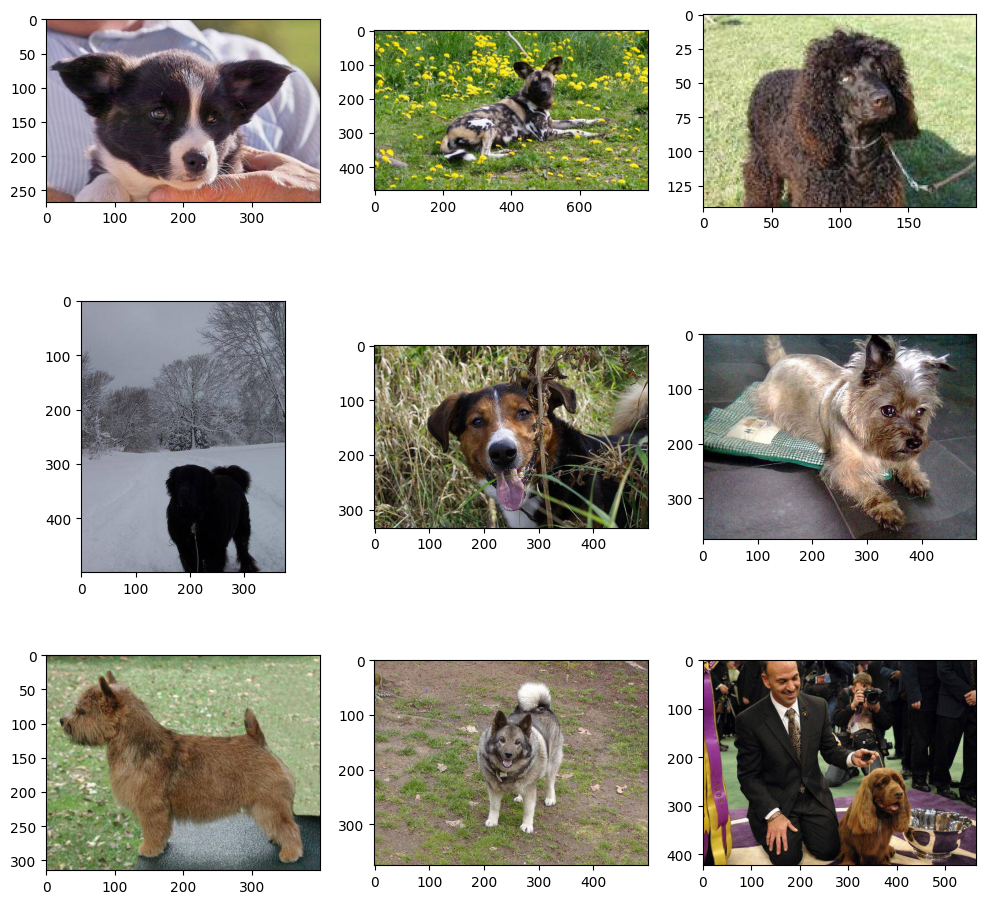

In [85]:
# 위에서 입력 데이터에 대한 EDA를 코드를 활용해서
# --> 모델의 성능을 체크하려고 함...
plt.figure( figsize=(12,12))

for c, test_img_path in enumerate(test_img_list[:9]):
    # 9개 그리기 위한 그림에 대한 위치...
    plt.subplot(3,3,c+1)
    # test 이미지를 가지고 오고, 모델에 적용해서 예상 정답을 출력,,,
    plt.imshow( plt.imread( test_img_path)) # 내가 푼 앞에 9개 문제를 보여준거

    # ---> 예측...
    curImg = cv2.imread( test_img_path )
    curImg = cv2.resize( curImg, ( image_size, image_size))

plt.show()

In [ ]:
# 체크 사항
# 1) 시험 문제들의 이미지 크기들이 제각각
# -> 일괄적으로 정사각형으로 사이즈 재조정을 해서 학습 했는데\
# 왜곡 현상이 있을 수 있겠구나!
# 리사이즈 때 발생하는 왜곡현상을 어찌할지

# -> 왜곡될 정보들을 쳐내고 그 대상만 누끼같은 작업으로 해볼 수 있음
# 9(segmentation 다른 모델을 활용할 수도)
# 3) 데이터 증각을 할 때 처리할 옵션들에 대한 고민도 해야 함
# -> 본인들의 생각대로 실험을 하고, kaggle에 업로드 하고 하면 됨

# to do list
# 1. 본인 스타일 대로 코드 정리
# 2. 실제 업로드 해서 모델 성능 확인 후 향상
# 최종 제출 : 구글 드라이브에 본인 등수 + 본인 채점 기주에 의한 점수 + 사용한 코드 & 모델 weight

# --
# 마지막날 확인

In [ ]:
# To Do List ( 과제 )
# --> 실제 모델링을 해서,,,kaggle에 직접 업로드를 해서 평가를 해보세요!!!
# --> 제일 성능이 높은 신 분은....뭔가 있겠죠!!!!!!!!

# 하실 것들은 : 직접 기존 모델들을 가지고 학습하는 방법을 연습!!!!
# + 내일 : 저장을 해두시고,,,,
# ===> test를 어떻게 풀고, 어떻게 업로드를 할지.......
#      ( 하는 방식들이 여러개가 있어서....)

# 저는 설명을 위해서 코드를 좀 불편하게 자르는 경향이 있으니..
# ==> 보시고 본인 스타일로 주석 간단히해서 본인 스타일로 정리들을 하세요!!!
# + 파일들에 대한 처리를 다 코드화 하는 작업!!!!!!!!!!!!!

# +++ yolo 로 이용해서 할 때....kaggle 업로드로 해보겠습니다..

In [ ]:
# 내일 : 오늘 못한 앞에 부분
#         + ResNet( 코드로는 생략..구조)
#         + AE 다른 구조에 적용을 해보겠습니다.
#        ( 대칭형으로 사용을 하는 것이고, 출력물이 이미지로 )
#         + gan 확장이 가능함.....
# --------------------------------
# + RNN + LSTM + Transformer
# --------------------------------
# 최신 모델들은 Transformer를 블로으로 사용해서 구조를 사용을 함.
# ++++ 여러 생성형으로 파생이 됨....